In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns
from sklearn import ensemble, tree, metrics
#from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model, preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from io import StringIO  
from IPython.display import Image  
import pydotplus
%matplotlib inline
data = pd.ExcelFile('DataDownload.xls')

In [2]:
assistance = data.parse('ASSISTANCE')
assistance_sub = assistance[['State',
                             'County',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PC_SNAPBEN10',
                             'PC_SNAPBEN15',
                             'SNAP_PART_RATE13',
                             'PCT_FREE_LUNCH14',
                             'PCT_REDUCED_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'REDEMP_WICS12'
                            ]]

In [3]:
access = data.parse('ACCESS')
access_sub = access[['State',
                     'County',
                     'LACCESS_POP10',
                     'PCT_LACCESS_POP10',
                     'LACCESS_LOWI10',
                     'PCT_LACCESS_LOWI10',
                     'LACCESS_HHNV10',
                     'PCT_LACCESS_HHNV10',
                     'LACCESS_SNAP15',
                     'PCT_LACCESS_SNAP15',
                     'LACCESS_CHILD10',
                     'PCT_LACCESS_CHILD10',
                     'LACCESS_SENIORS10',
                     'PCT_LACCESS_SENIORS10'
                     ]]

In [4]:
stores = data.parse('STORES')
stores_sub = stores[['State',
                     'County',
                     'GROC14',
                     'GROCPTH14',
                     'SUPERC14',
                     'SUPERCPTH14',
                     'CONVS14',
                     'CONVSPTH14',
                     'SPECS14',
                     'SPECSPTH14',
                     'SNAPS12',
                     'SNAPSPTH12',
                     'WICS12',
                     'WICSPTH12'
                    ]]

In [5]:
restaurants = data.parse('RESTAURANTS')
restaurants_sub = restaurants[['State',
                               'County',
                               'FFR14',
                               'FFRPTH14',
                               'FSR14',
                               'FSRPTH14',
                               'PC_FFRSALES12',
                               'PC_FSRSALES12'
                              ]]

In [6]:
insecurity = data.parse('INSECURITY')
insecurity_sub = insecurity[['State',
                             'County',
                             'FOODINSEC_10_12',
                             'VLFOODSEC_10_12',
                             'FOODINSEC_CHILD_03_11'
                            ]]

In [7]:
df = data.parse('Supplemental Data - County')
county = df[['State', 'County', '2010 Census Population', 'Population Estimate, 2011', 
              'Population Estimate, 2012', 'Population Estimate, 2013', 
              'Population Estimate, 2014', 'Population Estimate, 2015']].copy()

# Convert strings in pandas series (columns in the dataframe) where values containe a comma into numerical values.

#County['2010 Census Population'] = [int(x.replace(",", "")) for x in County['2010 Census Population']]
#print("Prove that is now converted to a numerical series" , County['2010 Census Population'].mean())

def remove_comma_from_series(var):
    """Parameters
        ---------
        var: pandas Series
        
        For each element of the series, this function will replace every instance of a comma with nothing,
        as represented by the empty quotation marks.  It will then turn the resulting string into an integer.
        Finally, it will return the integer.
    """
    
    new_var = [int(x.replace(",", "")) for x in var ]
    
    return new_var

# The first two columns list the state and country rather than any numeric values,
# so they'd trigger errors in our function.
# I'm sure there's a prettier way of skipping them than plugging the function into a try-except block,
# but it works.

for x in county:
    try:
        county[x] = remove_comma_from_series(county[x])
    except:
        continue

In [8]:
master = county.merge(assistance_sub, on = ['State', 'County'])\
    .merge(access_sub, on = ['State', 'County'])\
    .merge(stores_sub, on = ['State', 'County'])\
    .merge(restaurants_sub, on = ['State', 'County'])\
    .merge(insecurity, on = ['State', 'County'])

In [9]:
master_subset = master[['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PCT_FREE_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'PCT_LACCESS_HHNV10',
                             'PCT_LACCESS_SNAP15',
                             'SNAPSPTH12']].copy()

In [10]:
master_subset.dropna(subset='PC_SNAPBEN15', inplace=True)

In [11]:
columns = ['2010 Census Population', 'PC_SNAPBEN10',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PCT_FREE_LUNCH14',
                              'PCT_LACCESS_HHNV10',
                             'PCT_LACCESS_SNAP15',
                             'SNAPSPTH12']
for c in columns:
    master_subset[c].fillna(master_subset[c].mean(), inplace=True)

In [12]:
master_subset.fillna(value=master_subset['PC_WIC_REDEMP12'].median(), inplace=True)

In [13]:
#Same as above, but removing PCT_LACCESS_SNAP15 and PC_SNAPBEN10
X = master_subset[['2010 Census Population',
                            'REDEMP_SNAPS12',
                            'PCT_SNAP12',
                            'PCT_FREE_LUNCH14',
                            'PC_WIC_REDEMP12',
                            'PCT_LACCESS_HHNV10',
                            'SNAPSPTH12']]
y = master_subset[['PC_SNAPBEN15']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 123)

In [14]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2491, 7) (2491, 1)
(831, 7) (831, 1)


In [15]:
rModel = linear_model.LinearRegression(normalize=True)

In [16]:
rModel.fit(X_train, y_train)

C:\Users\Andy\miniconda3\envs\testbed\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


LinearRegression(normalize=True)

In [17]:
print(rModel.score(X_train, y_train))

0.7363977662904876


In [18]:
y_pred = rModel.predict(X_test)

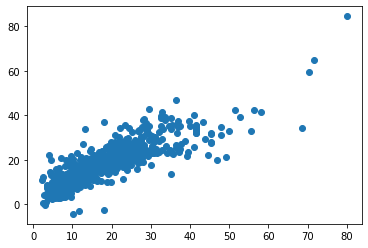

In [19]:
plt.scatter(y_test,y_pred)

In [20]:
print(rModel.score(X_test, y_test))

0.7186780719707717


In [21]:
metrics.mean_squared_error(y_test, y_pred)

29.366898279802726

In [22]:
#same but with pipeline
model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

In [23]:
model.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler(with_mean=False)),
                ('linearregression', LinearRegression())])

In [24]:
print(model.score(X_train, y_train))

0.7363977662904876


In [25]:
y_pred = model.predict(X_test)

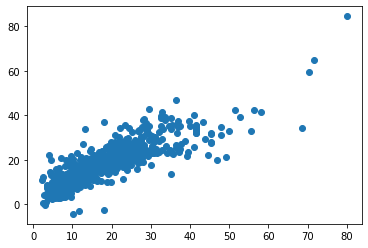

In [26]:
plt.scatter(y_test,y_pred)

In [27]:
print(model.score(X_test, y_test))

0.7186780719707717


In [28]:
metrics.mean_squared_error(y_test, y_pred)

29.36689827980273

In [29]:
# Declare a variable called entr_model and use tree.DecisionTreeRegressor. 
entr_model = tree.DecisionTreeRegressor(random_state = 1234)

# Call fit() on entr_model
entr_model.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred 
y_pred = entr_model.predict(X_test)

# Call Series on our y_pred variable with the following: pd.Series(y_pred)
y_pred = pd.Series(y_pred)

# Check out entr_model
entr_model

#look up: DecisionTreeRegressor
#rmse on all algorithms: linear regression and Decision Tree, maybe try random forest after

DecisionTreeRegressor(random_state=1234)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.177727 to fit



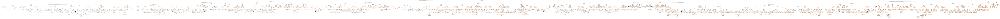

In [30]:
# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
tree.export_graphviz(entr_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["NO", "YES"]) 

# Alternatively for class_names use entr_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [31]:
metrics.mean_squared_error(y_test, y_pred)

41.902585805230444

In [32]:
forest_model = ensemble.RandomForestRegressor(random_state = 1234)
# Call fit() on entr_model
forest_model.fit(X_train, y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred 
y_pred = forest_model.predict(X_test)

# Call Series on our y_pred variable with the following: pd.Series(y_pred)
y_pred = pd.Series(y_pred)

# Check out entr_model
forest_model

C:\Users\Andy\AppData\Local\Temp\ipykernel_16960\1369036707.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest_model.fit(X_train, y_train)


RandomForestRegressor(random_state=1234)

In [33]:
metrics.mean_squared_error(y_test, y_pred)

23.302782246453965

In [34]:
#forest_model.feature_importances_
pd.DataFrame(zip(X_test.columns, forest_model.feature_importances_))

,0,1
0,2010 Census Population,0.048270
1,REDEMP_SNAPS12,0.067507
2,PCT_SNAP12,0.050610
3,PCT_FREE_LUNCH14,0.661321
4,PC_WIC_REDEMP12,0.036497
5,PCT_LACCESS_HHNV10,0.065760
6,SNAPSPTH12,0.070035


In [35]:
#4 statistical regions used by the US Census Bureau
#Northeast=['CT', 'ME', 'MA', 'NH', 'NJ', 'NY', 'PA', 'RI', 'VT']
#Midwest=['IA', 'IL', 'IN', 'KS', 'MI', 'MN', 'MO', 'ND', 'NE', 'OH', 'SD', 'WI']
#South=['AL', 'AR', 'DC', 'DE', 'FL', 'GA', 'KY', 'LA', 'MD', 'MS', 'NC', 'OK', 'SC', 'TN', 'TX', 'VA', 'WV']
#West=['AK', 'AZ', 'CA', 'CO', 'HI', 'ID', 'MT', 'NM', 'NV', 'OR', 'UT', 'WA', 'WY']
#Regions=[Northeast, Midwest, South, West]

#9 statistical divisions used by the US Census Bureau
New_England=['CT', 'ME', 'MA', 'NH', 'RI', 'VT']
Mid_Atlantic=['NJ', 'NY', 'PA']
East_North_Central=['IL', 'IN', 'MI', 'OH', 'WI']
West_North_Central=['IA', 'KS', 'MN', 'MO', 'ND', 'NE', 'SD']
South_Atlantic=['DC', 'DE', 'FL', 'GA', 'MD', 'NC', 'SC', 'VA', 'WV']
East_South_Central=['AL', 'KY', 'MS', 'TN']
West_South_Central=['AR', 'LA', 'OK', 'TX']
Mountain=['AZ', 'CO', 'ID', 'MT', 'NM', 'NV', 'UT', 'WY']
Pacific=['AK', 'CA', 'HI', 'OR', 'WA']
Divisions=[New_England, Mid_Atlantic, East_North_Central, West_North_Central, South_Atlantic, East_South_Central, West_South_Central, Mountain, Pacific]

def state_to_division(x):
    if x in New_England:
        return "New England"
    elif x in Mid_Atlantic:
        return "Mid Atlantic"
    elif x in East_North_Central:
        return "East North Central"
    elif x in West_North_Central:
        return "West North Central"
    elif x in South_Atlantic:
        return "South Atlantic"
    elif x in East_South_Central:
        return "East South Central"
    elif x in West_South_Central:
        return "West South Central"
    elif x in Mountain:
        return "Mountain"
    elif x in Pacific:
        return "Pacific"
    else:
        return

master['Division'] = master['State'].map(lambda x: state_to_division(x))

In [36]:
PC_SNAPBEN = master[['PC_SNAPBEN10', 'PC_SNAPBEN15']].dropna()
x=PC_SNAPBEN['PC_SNAPBEN10'].to_numpy()
y=PC_SNAPBEN['PC_SNAPBEN15'].to_numpy()
#PC_SNAPBEN15_a = master['PC_SNAPBEN15'].dropna().to_numpy()

a, b = np.polyfit(x, y, 1)
print(a, b)

0.9386478301070688 0.197412319332093


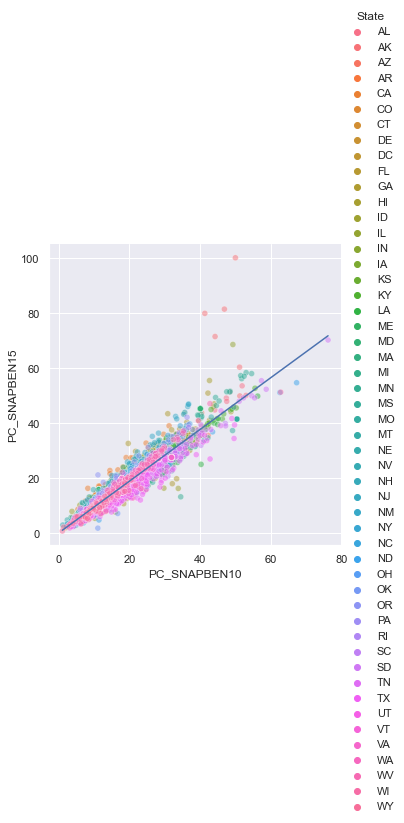

In [37]:
sns.set_theme()
p1 = sns.relplot(data = master, x = 'PC_SNAPBEN10', y = 'PC_SNAPBEN15', hue = 'State', alpha=0.5)

xtest = np.linspace(PC_SNAPBEN['PC_SNAPBEN10'].min(),PC_SNAPBEN['PC_SNAPBEN10'].max(),10)
ax = p1.axes[0,0]
ax.plot(xtest, a * xtest + b, '-')

<AxesSubplot:xlabel='PC_SNAPBEN10', ylabel='PC_SNAPBEN15'>

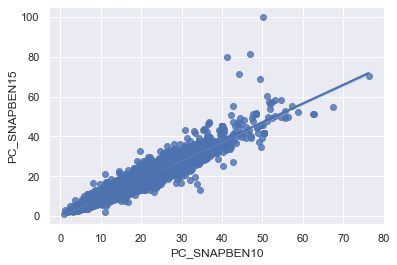

In [38]:
sns.regplot(data = master, x = 'PC_SNAPBEN10', y = 'PC_SNAPBEN15')

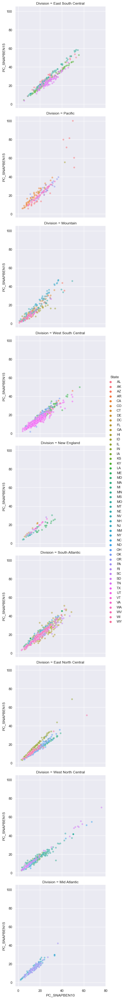

In [39]:
sns.relplot(data = master, x = 'PC_SNAPBEN10', y = 'PC_SNAPBEN15', row='Division', hue = 'State', alpha=0.5)

In [40]:
ProfileReport(master, 'master profile report', explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

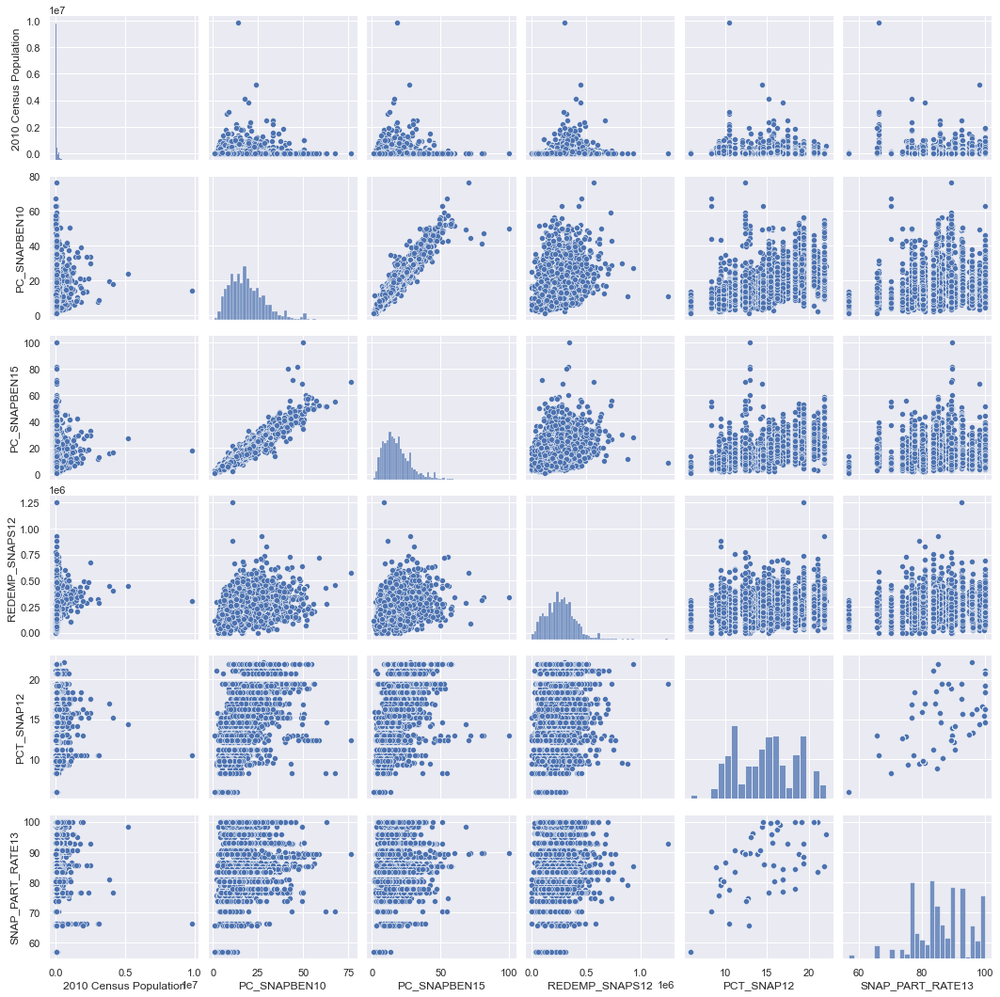

In [41]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15', 'REDEMP_SNAPS12', 'PCT_SNAP12', 'SNAP_PART_RATE13'])

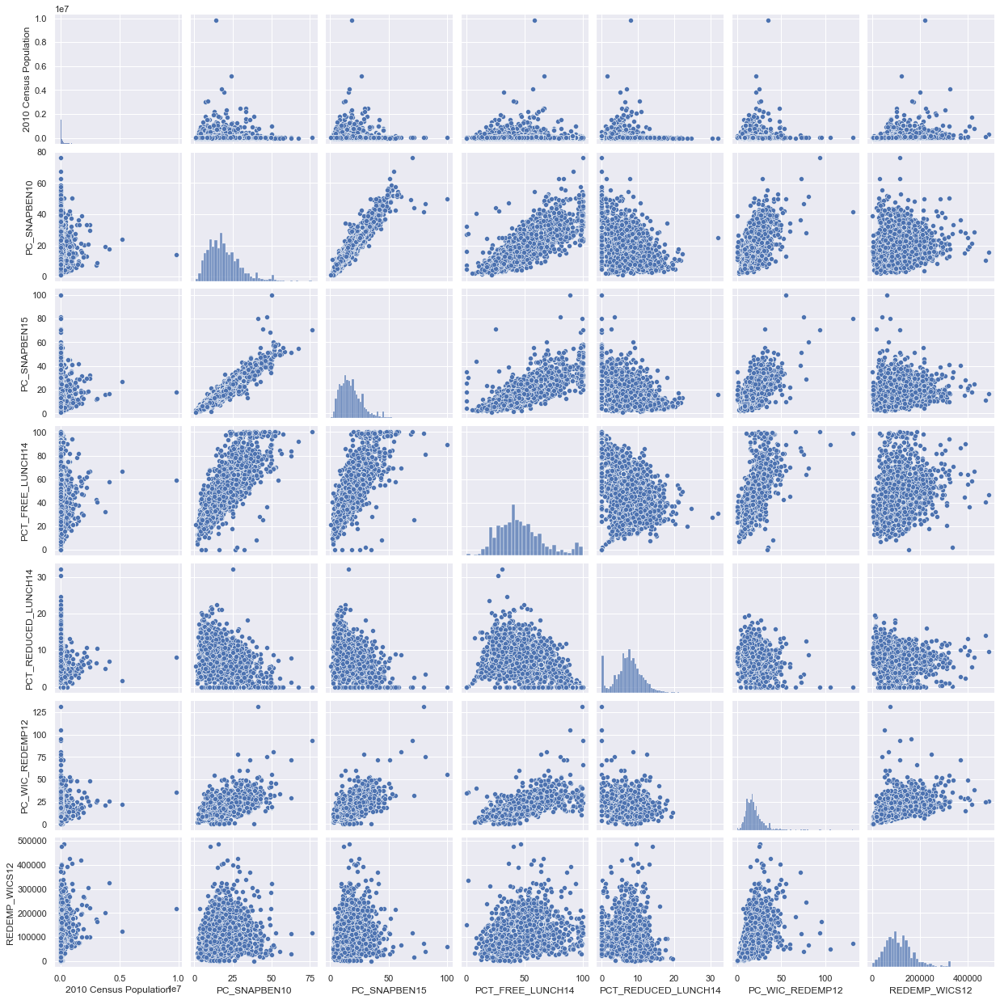

In [42]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'PCT_FREE_LUNCH14',
                             'PCT_REDUCED_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'REDEMP_WICS12'])

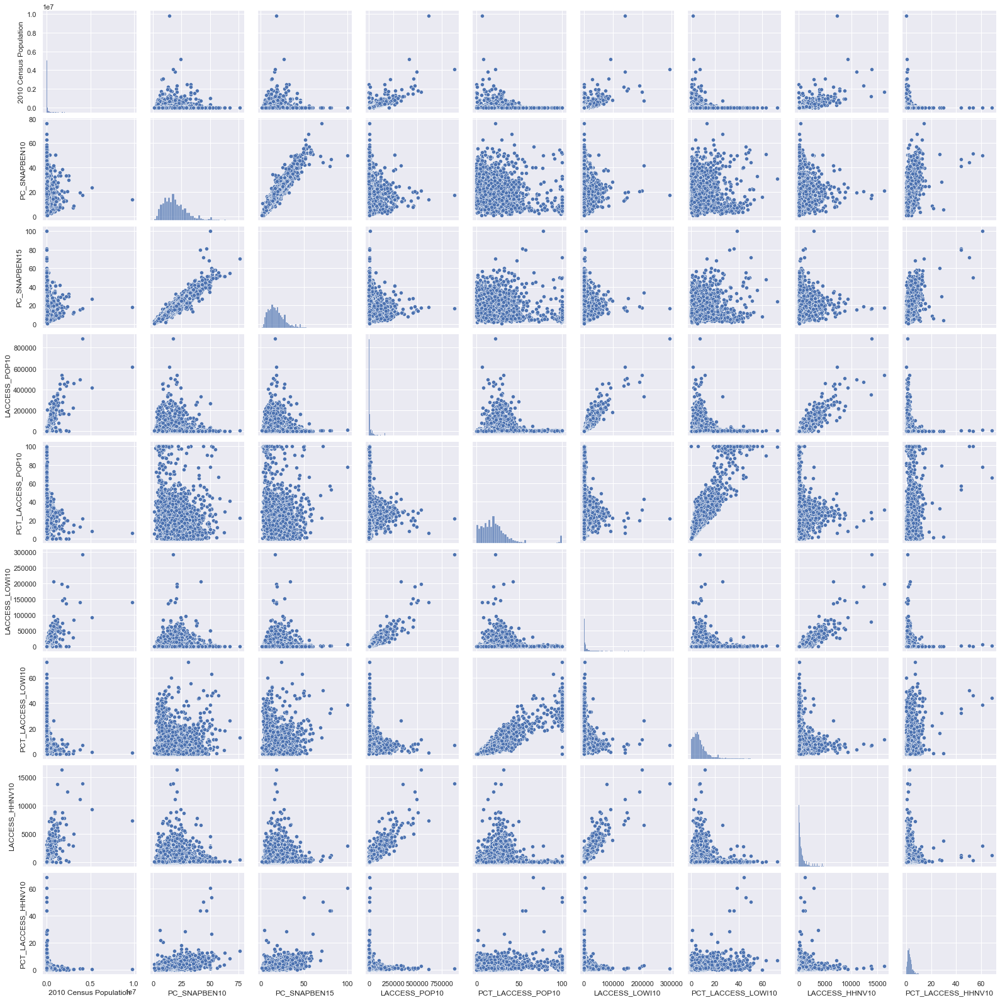

In [43]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'LACCESS_POP10',
                     'PCT_LACCESS_POP10',
                     'LACCESS_LOWI10',
                     'PCT_LACCESS_LOWI10',
                     'LACCESS_HHNV10',
                     'PCT_LACCESS_HHNV10'])

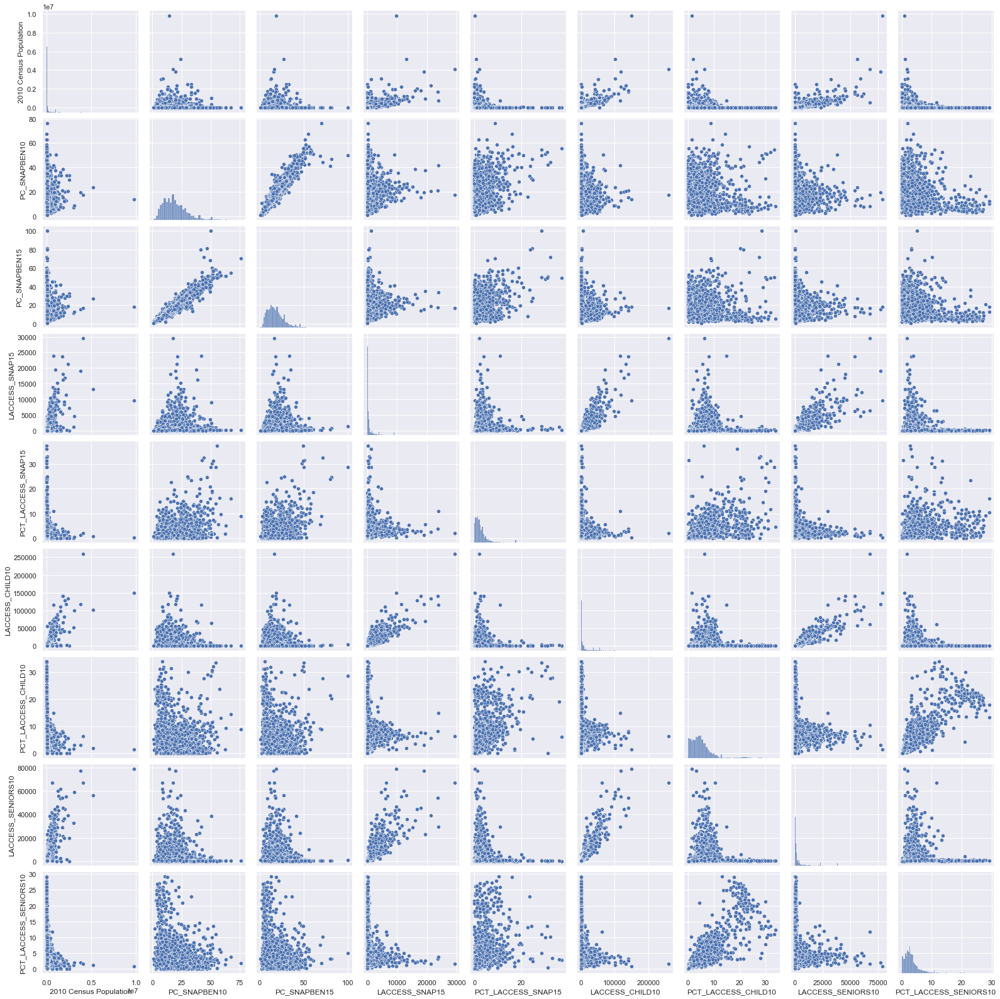

In [44]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'LACCESS_SNAP15',
                     'PCT_LACCESS_SNAP15',
                     'LACCESS_CHILD10',
                     'PCT_LACCESS_CHILD10',
                     'LACCESS_SENIORS10',
                     'PCT_LACCESS_SENIORS10'])

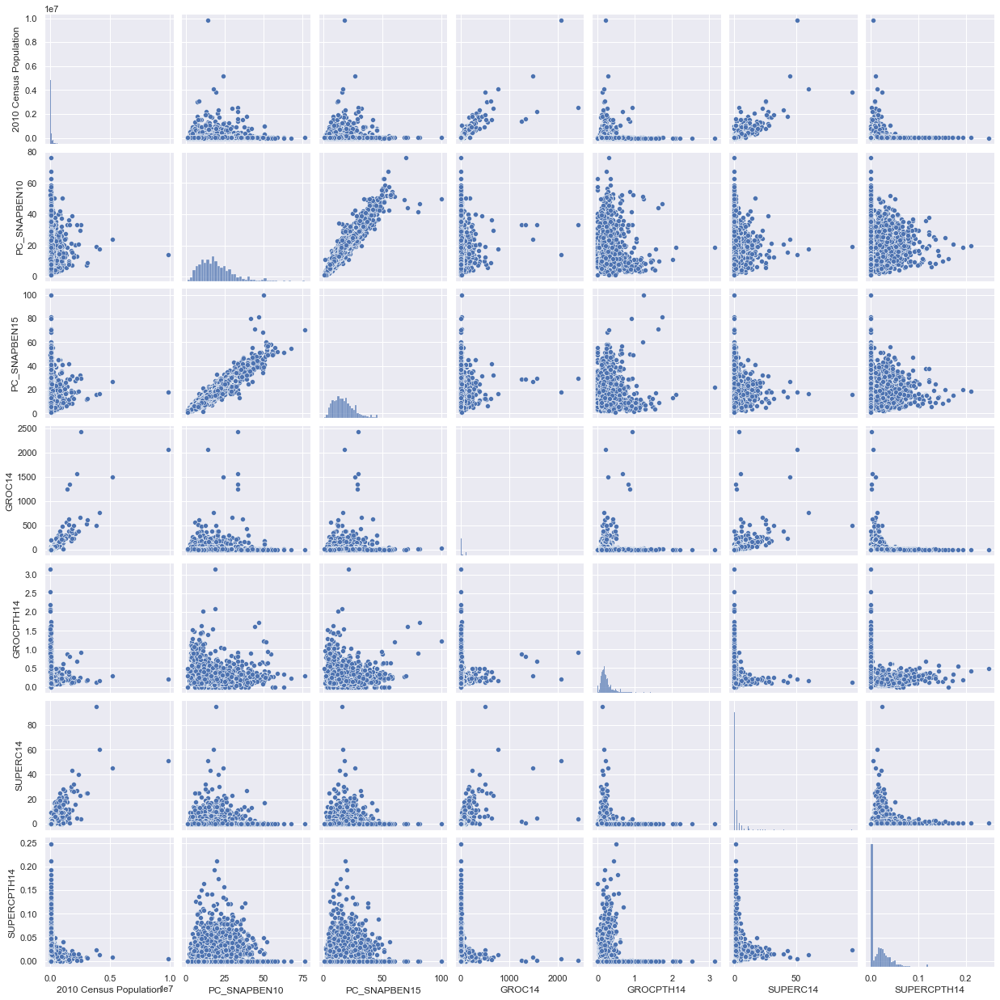

In [45]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'GROC14',
                     'GROCPTH14',
                     'SUPERC14',
                     'SUPERCPTH14'])

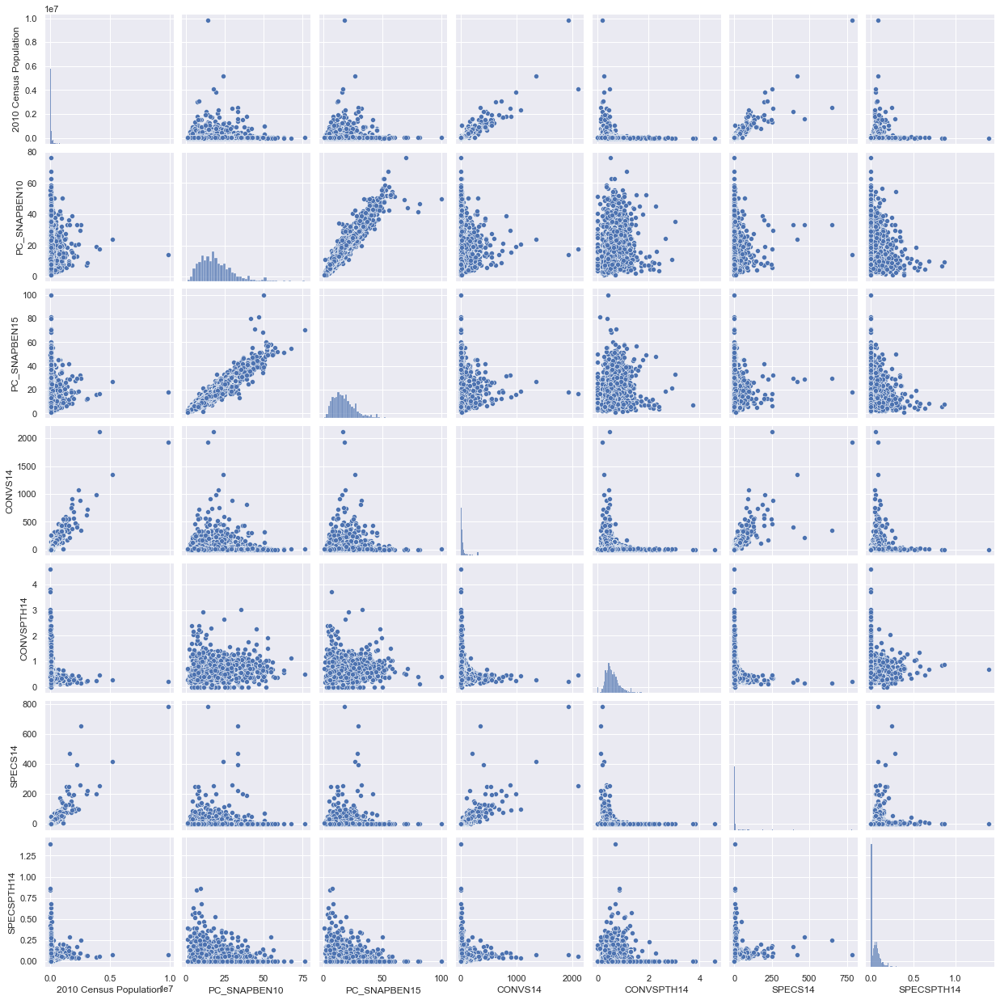

In [46]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'CONVS14',
                     'CONVSPTH14',
                     'SPECS14',
                     'SPECSPTH14'])

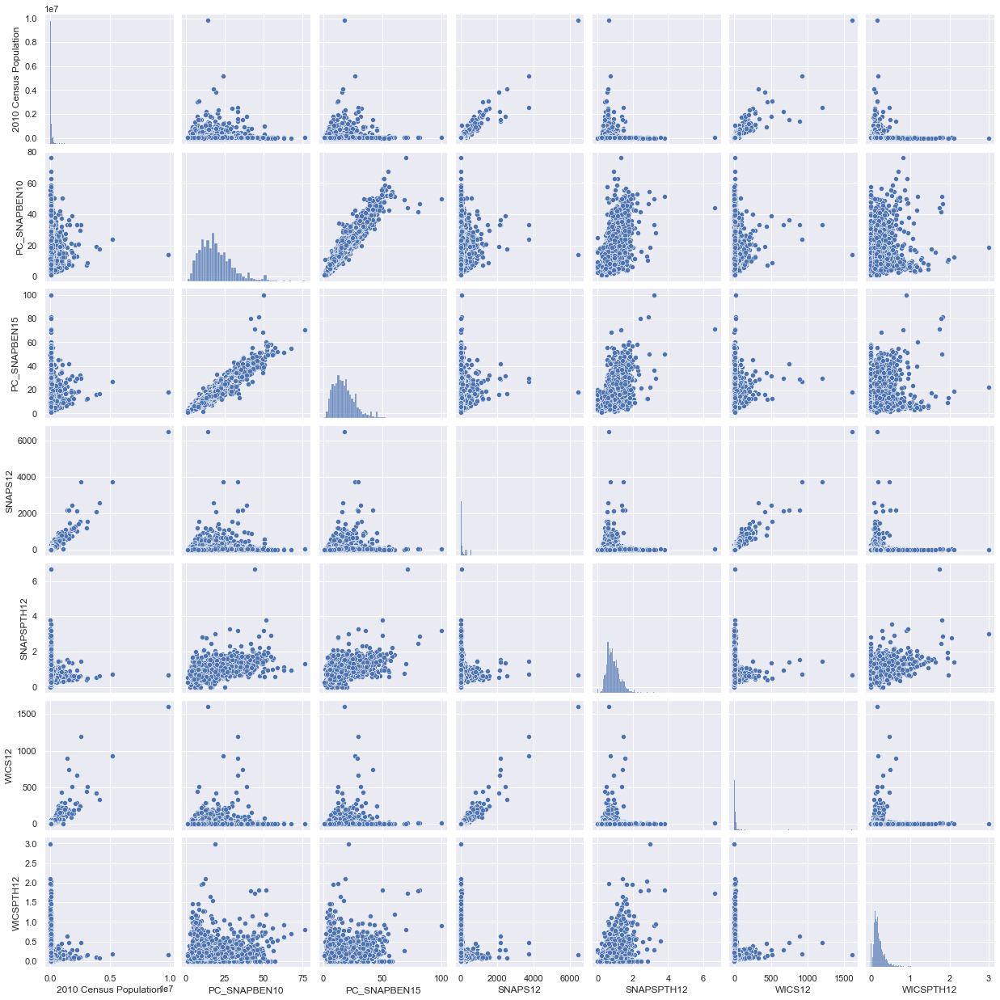

In [47]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                     'SNAPS12',
                     'SNAPSPTH12',
                     'WICS12',
                     'WICSPTH12'])

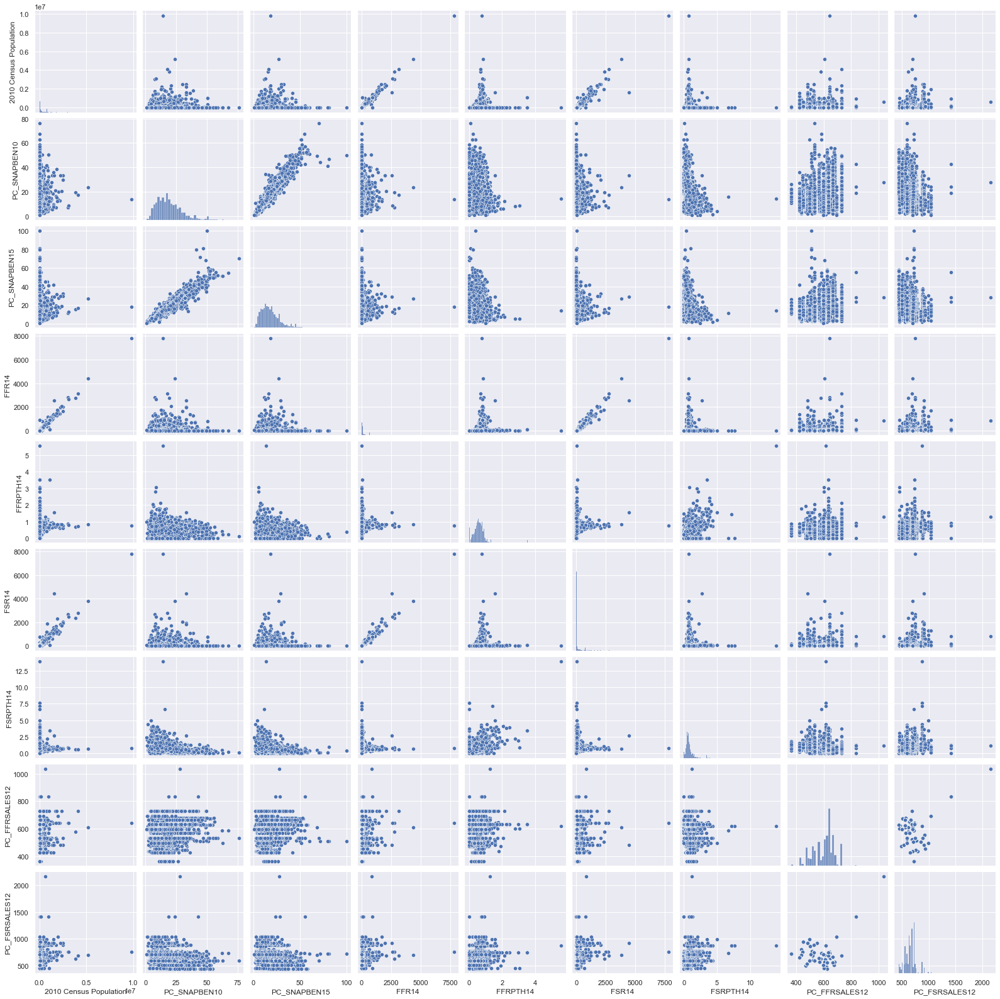

In [48]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                               'FFR14',
                               'FFRPTH14',
                               'FSR14',
                               'FSRPTH14',
                               'PC_FFRSALES12',
                               'PC_FSRSALES12'])

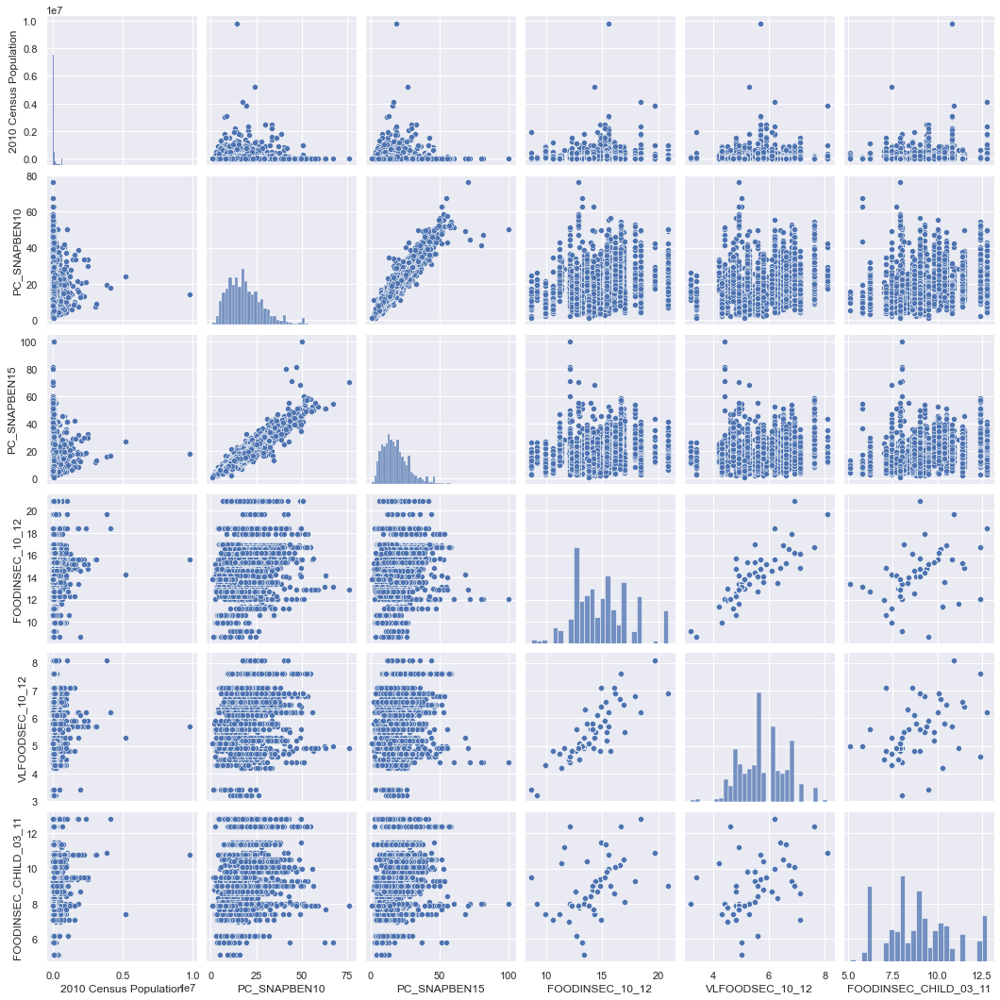

In [49]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'FOODINSEC_10_12',
                             'VLFOODSEC_10_12',
                             'FOODINSEC_CHILD_03_11'])

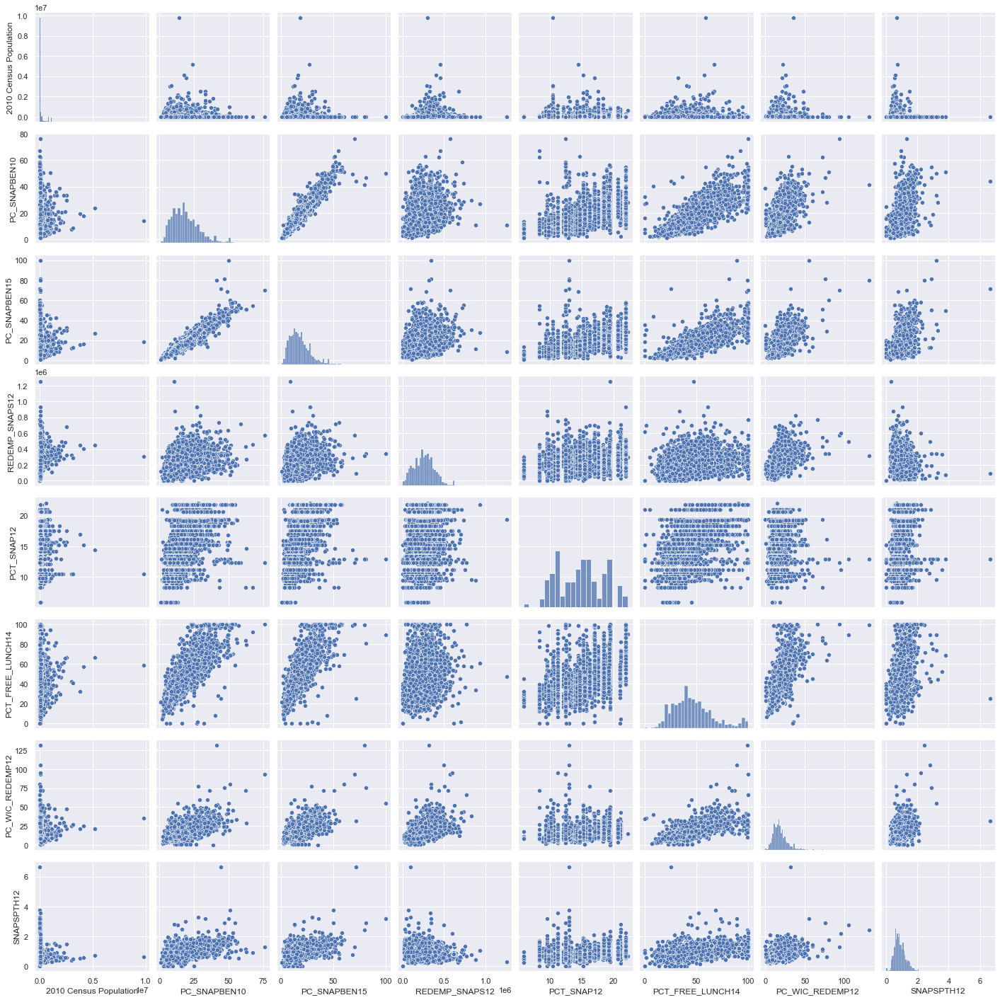

In [50]:
sns.pairplot(data=master, vars=['2010 Census Population', 'PC_SNAPBEN10', 'PC_SNAPBEN15',
                             'REDEMP_SNAPS12',
                             'PCT_SNAP12',
                             'PCT_FREE_LUNCH14',
                             'PC_WIC_REDEMP12',
                             'SNAPSPTH12'])

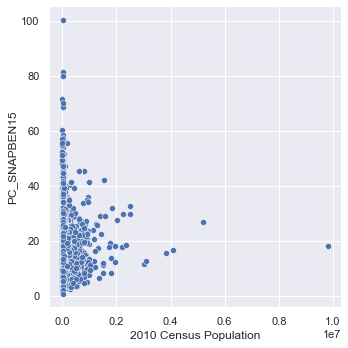

In [51]:
sns.set_theme()
sns.relplot(data = master, x = '2010 Census Population', y = 'PC_SNAPBEN15')

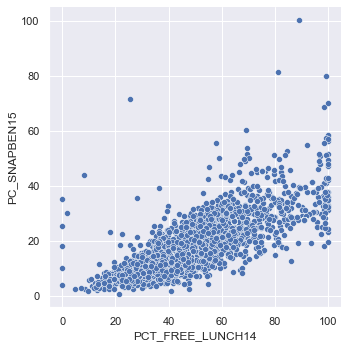

In [52]:
sns.set_theme()
sns.relplot(data = master, x = 'PCT_FREE_LUNCH14', y = 'PC_SNAPBEN15')

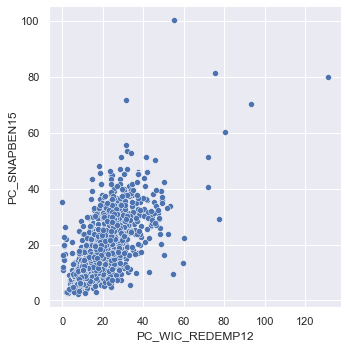

In [53]:
sns.set_theme()
sns.relplot(data = master, x = 'PC_WIC_REDEMP12', y = 'PC_SNAPBEN15')

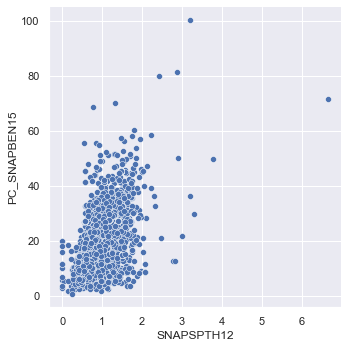

In [54]:
sns.set_theme()
sns.relplot(data = master, x = 'SNAPSPTH12', y = 'PC_SNAPBEN15')

In [55]:
# Run this block for model evaluation metrics 
#print("Model - no max depth")
#print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
#print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
#print('Precision score for "Yes"' , metrics.precision_score(y_test,y_pred, pos_label = "YES"))
#print('Precision score for "No"' , metrics.precision_score(y_test,y_pred, pos_label = "NO"))
#print('Recall score for "Yes"' , metrics.recall_score(y_test,y_pred, pos_label = "YES"))
#print('Recall score for "No"' , metrics.recall_score(y_test,y_pred, pos_label = "NO"))